In [1]:
import sys
sys.path.append('../helpers/')

import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm

from preprocessing import Preprocessing

preprocessor = Preprocessing()

%load_ext autoreload
%autoreload 2


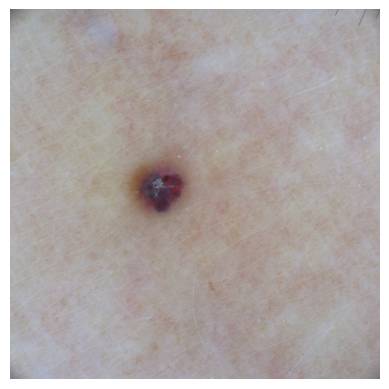

In [2]:
def display_img(image, gray=False):
    if gray:
        plt.imshow(image, cmap='gray')
    else:
        # plt.imshow(image)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')


# def crop_frame(image, threshold = 0.2, debug=False, margin=0):
#     # Convert the image to grayscale
#     gray = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2GRAY)
        
#     # Gaussian blur and binarize
#     blurred = cv2.GaussianBlur(gray, (0, 0), 2)
#     _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

#     # Find connected components and their properties
#     contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
#     # Cropping flag for identifying cropped images
#     CROP_FLAG = False

#     if contours:        
#         # Calculate the center and diameter of the largest component
#         largest_contour = max(contours, key=cv2.contourArea)

#         # finds a circle of the minimum area enclosing an area
#         (x , y), radius = cv2.minEnclosingCircle(largest_contour) # returns the center and radius

#         # casting from float to int for precision, necessary for visualizing 
#         center = (int(x), int(y)) #(x, y)
#         radius = int(radius)

#         if debug:
#             # for debugging we can visualize the contour of the minimum enclosing circle using its radius
#             print(center, radius)
#             cv2.circle(image, center, 5, (255, 0, 0), -1)   # viz the center as a dot (small radius)
#             cv2.circle(image, center, radius, (255,0,0), 3) # viz the center as a crcle
        
#         # Define the cropping box
#         x_min = int(center[0] - radius + margin * radius)
#         x_max = int(center[0] + radius - margin * radius)
#         y_min = int(center[1] - radius + margin * radius)
#         y_max = int(center[1] + radius - margin * radius)

#         # check if we need to crop the images based on their intensities mean
#         cropped_image = image.copy()[y_min:y_max, x_min:x_max]

#         # Calculate mean values inside and outside the cropping box
#         mean_inside = np.mean(cropped_image)

#         # Calculate mean values outside the cropping box
#         mean_above = np.mean(image[:y_min, :])
#         mean_below = np.mean(image[y_max:, :])
#         mean_left = np.mean(image[y_min:y_max, :x_min])
#         mean_right = np.mean(image[y_min:y_max, x_max:])

#         # Calculate mean_outside as the average of the four regions
#         mean_outside = (mean_above + mean_below + mean_left + mean_right) / 4

#         if mean_outside / mean_inside < threshold:
#             # print("Required cropping")
#             ret = cropped_image
#             CROP_FLAG = True
#         else: 
#             # print("Doesn't required cropping")
#             ret = image
#     else:
#         # print("No contours found, doesn't required cropping")
#         ret = image

#     return ret, CROP_FLAG

# mel00759
# nev00002
img_name = 'vac00135.jpg'

img_dir  = os.path.join(os.getcwd(), '../challenge1/train/others', img_name)
image = cv2.imread(img_dir,cv2.IMREAD_COLOR)
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


img, _ = preprocessor.crop_frame(image)    
display_img(img)


In [17]:
# # Testing 
# # --------------------------------------

# nevus_dir = os.path.join(os.getcwd(), '../challenge1/train/nevus')
# others_dir = os.path.join(os.getcwd(), '../challenge1/train/others')

# directory = os.fsencode(nevus_dir)

# counter = 0
    
# for file in tqdm(os.listdir(directory)):
#      filename = os.fsdecode(file)
#      if filename.endswith(".jpg"): 
#       #   print(filename)

#       img_dir  = os.path.join(os.getcwd(), '../challenge1/train/nevus', filename)

#       image = cv2.imread(img_dir,cv2.IMREAD_COLOR)

#       image, flag = crop_frame(image, threshold = 0.2)

#       if flag:
#          counter = counter + 1
#      else:
#          continue
     
# print(f"Nevus class: {counter}")

# # --------------------------------------

# directory = os.fsencode(others_dir)

# counter = 0

# for file in tqdm(os.listdir(directory)):
#      filename = os.fsdecode(file)
#      if filename.endswith(".jpg"): 
#       #   print(filename)

#       img_dir  = os.path.join(os.getcwd(), '../challenge1/train/others', filename)

#       image = cv2.imread(img_dir,cv2.IMREAD_COLOR)

#       image, flag = preprocessor.crop_frame(image, threshold = 0.2)

#       if flag:
#          counter = counter + 1
#      else:
#          continue
     
# print(f"Others class: {counter}")

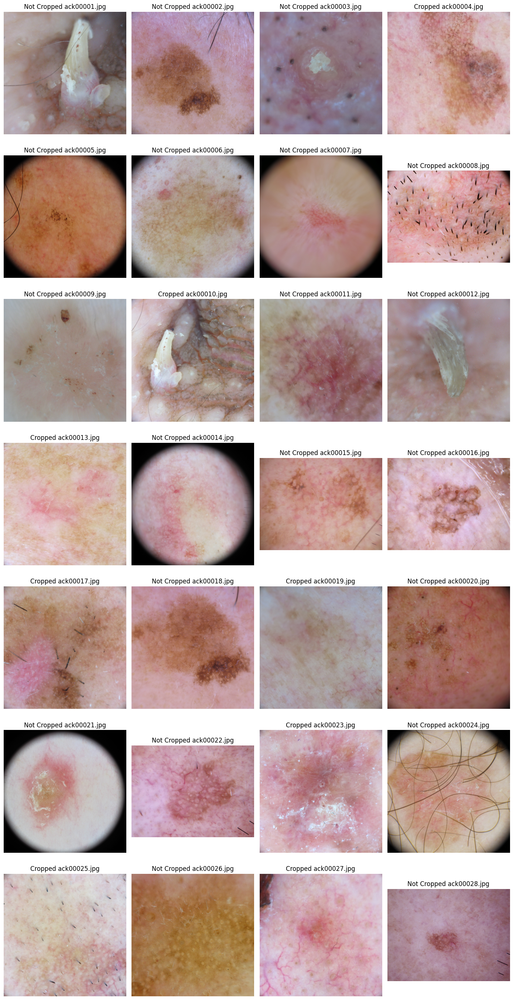

In [29]:
others_dir = os.path.join(os.getcwd(), '../challenge1/train/others')
directory = os.fsencode(others_dir)

plt.figure(figsize=(14, 28))
for i in range(28):
    plt.subplot(7, 4, i + 1)
    img_name = os.listdir(directory)[i]
    img_dir  = os.path.join(os.getcwd(), '../challenge1/train/others', img_name.decode('ascii'))
    img = cv2.imread(img_dir, cv2.IMREAD_COLOR)
    img, is_cropped = preprocessor.crop_frame(img, threshold = 0.2)

    plt.title(("Cropped" if is_cropped else "Not Cropped") + f" {img_name.decode('ascii')}")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.tight_layout()

With cropping entirely the black corners for the detected images

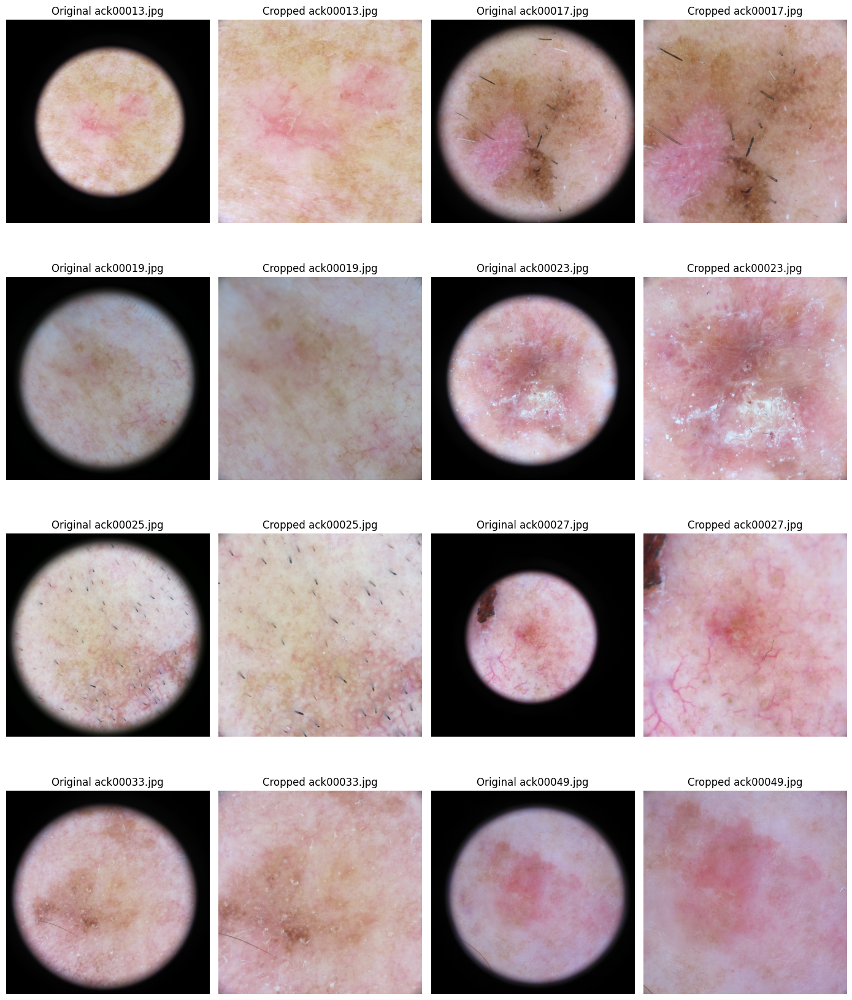

In [35]:
others_dir = os.path.join(os.getcwd(), '../challenge1/train/others')
directory = os.fsencode(others_dir)

plt.figure(figsize=(14, 42))  # Increase the height of the figure to accommodate more images
subplot_index = 1  # Initialize the subplot index

# Increase the range to plot more images
for i in range(0, 50, 2):
    if i >= len(os.listdir(directory)):
        break  # Exit the loop if there are no more images

    img_name = os.listdir(directory)[i]
    img_dir = os.path.join(os.getcwd(), '../challenge1/train/others', img_name.decode('ascii'))
    img = cv2.imread(img_dir, cv2.IMREAD_COLOR)
    img_cropped, is_cropped = preprocessor.crop_frame(img, threshold=0.2, margin=0.31)

    if not is_cropped:
        continue

    plt.subplot(10, 4, subplot_index)  # Increase the number of rows to accommodate more images
    plt.title("Original " + img_name.decode('ascii'))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.tight_layout()

    plt.subplot(10, 4, subplot_index + 1)
    plt.title("Cropped " + img_name.decode('ascii'))
    plt.imshow(cv2.cvtColor(img_cropped, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.tight_layout()

    subplot_index += 2  # Increment the subplot index by 2 for the next pair of images

plt.show()

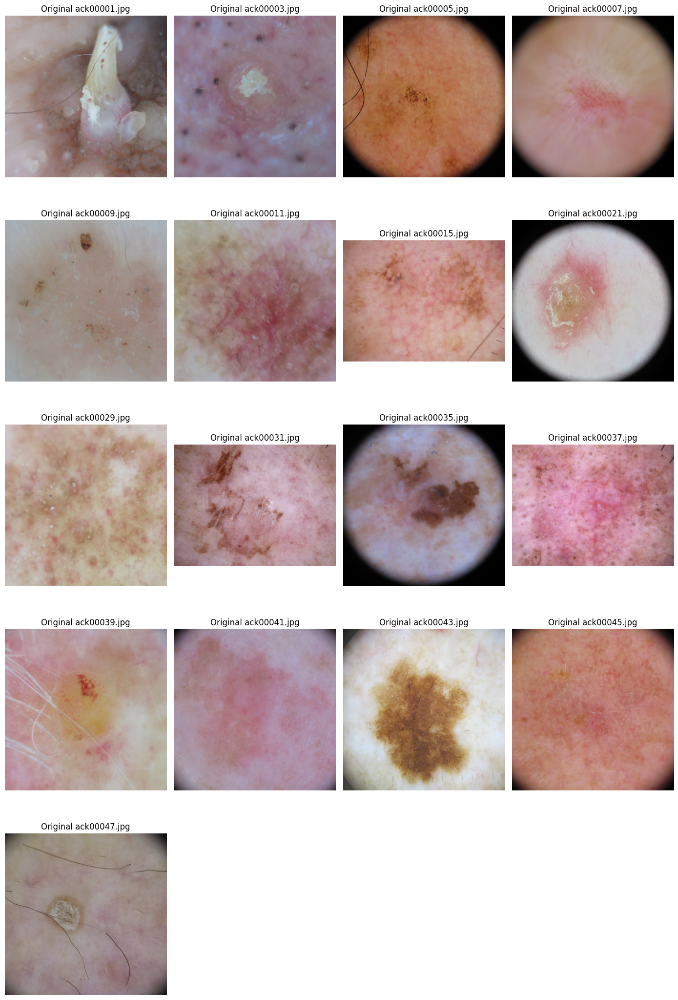

In [37]:
others_dir = os.path.join(os.getcwd(), '../challenge1/train/others')
directory = os.fsencode(others_dir)

plt.figure(figsize=(14, 42))  # Increase the height of the figure to accommodate more images
subplot_index = 1  # Initialize the subplot index

# Increase the range to plot more images
for i in range(0, 50, 2):
    if i >= len(os.listdir(directory)):
        break  # Exit the loop if there are no more images

    img_name = os.listdir(directory)[i]
    img_dir = os.path.join(os.getcwd(), '../challenge1/train/others', img_name.decode('ascii'))
    img = cv2.imread(img_dir, cv2.IMREAD_COLOR)
    img_cropped, is_cropped = preprocessor.crop_frame(img, threshold=0.2, margin=0.31)

    if is_cropped:
        continue  # Skip cropped images

    plt.subplot(10, 4, subplot_index)  # Increase the number of rows to accommodate more images
    plt.title("Original " + img_name.decode('ascii'))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.tight_layout()

    subplot_index += 1  # Increment the subplot index by 1 for the next image

plt.show()
